In [1]:
import scanpy as sc
import os
sc.set_figure_params(dpi=200, dpi_save=200)

/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/optuna/study/_optimize.py:29: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from optuna import progress_bar as pbar_module


In [2]:
data_dir = "/lustre/groups/ml01/workspace/ot_perturbation/analysis/sciplex"
out_dir = "/lustre/groups/ml01/workspace/ot_perturbation/figures/sciplex/pseudodose"

In [3]:
adata = sc.read_h5ad(os.path.join(data_dir, "pseudodosages_dacinostat.h5ad"))

In [4]:
color_dict = {"CF": "#B12F8C", "GT": "#3F8AA6", "control": "#000000", "other": "#B6B6B6"}

In [5]:
adata.obs["logdose"].value_counts()

logdose
1.000000    954
4.000000    935
3.000000    858
2.000000    820
0.000000    500
1.333333    500
1.666667    500
2.333333    500
2.666667    500
3.333333    500
3.666667    500
Name: count, dtype: int64

In [6]:
observed_dosages = [0.0, 1.0, 2.0, 3.0, 4.0]

In [7]:
adata = adata[adata.obs["logdose"].isin(observed_dosages)]

In [8]:
adata[adata.obs["mode"]=="pred"].obs["logdose"].value_counts()

logdose
1.0    500
2.0    500
3.0    500
4.0    500
Name: count, dtype: int64

In [9]:
adata.obs["mode"].value_counts()

mode
True    2067
pred    2000
Name: count, dtype: int64

In [10]:
def get_model(x):
    if x["mode"]=="pred":
        return "CF"
    if x["dose"]==0.0:
        return "control"
    return "GT"
adata.obs["model"] = adata.obs.apply(get_model, axis=1)

/tmp/ipykernel_1063317/2079336757.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["model"] = adata.obs.apply(get_model, axis=1)


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


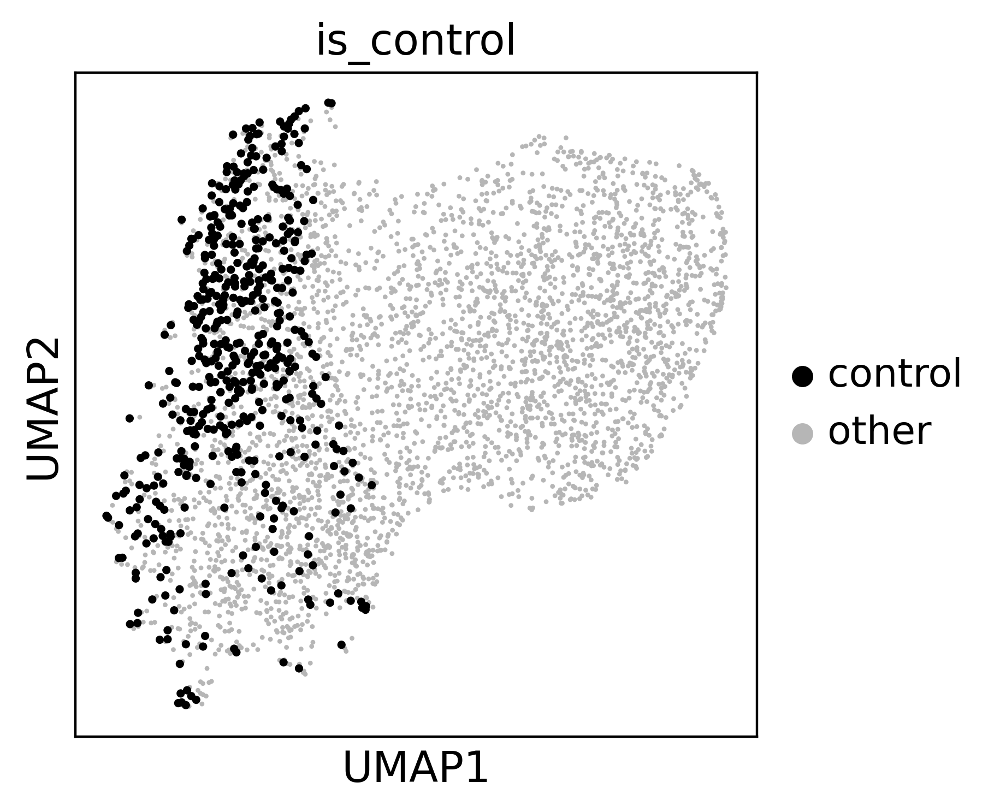

In [11]:
adata.obs["is_control"] = adata.obs.apply(lambda x: "control" if x["model"]=="control" else "other", axis=1)

order = list(adata[adata.obs["model"]!="control"].obs_names) + list(adata[adata.obs["model"]=="control"].obs_names)
sizes = [30 if el=="control" else 10 for el in adata[order].obs["model"]]
fig= sc.pl.umap(adata[order], color="is_control", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_control.png"))

/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


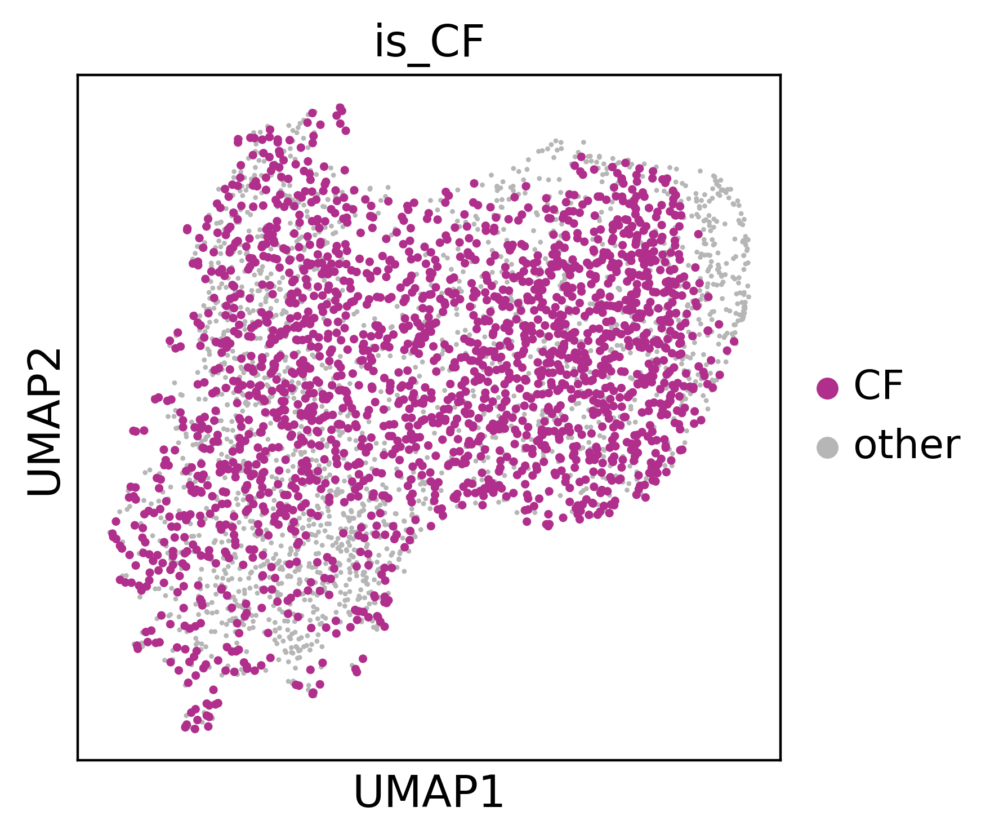

In [12]:
adata.obs["is_CF"] = adata.obs.apply(lambda x: "CF" if x["model"]=="CF" else "other", axis=1)

order = list(adata[adata.obs["model"]!="CF"].obs_names) + list(adata[adata.obs["model"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["model"]]
fig = sc.pl.umap(adata[order], color="is_CF", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds.png"))

/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


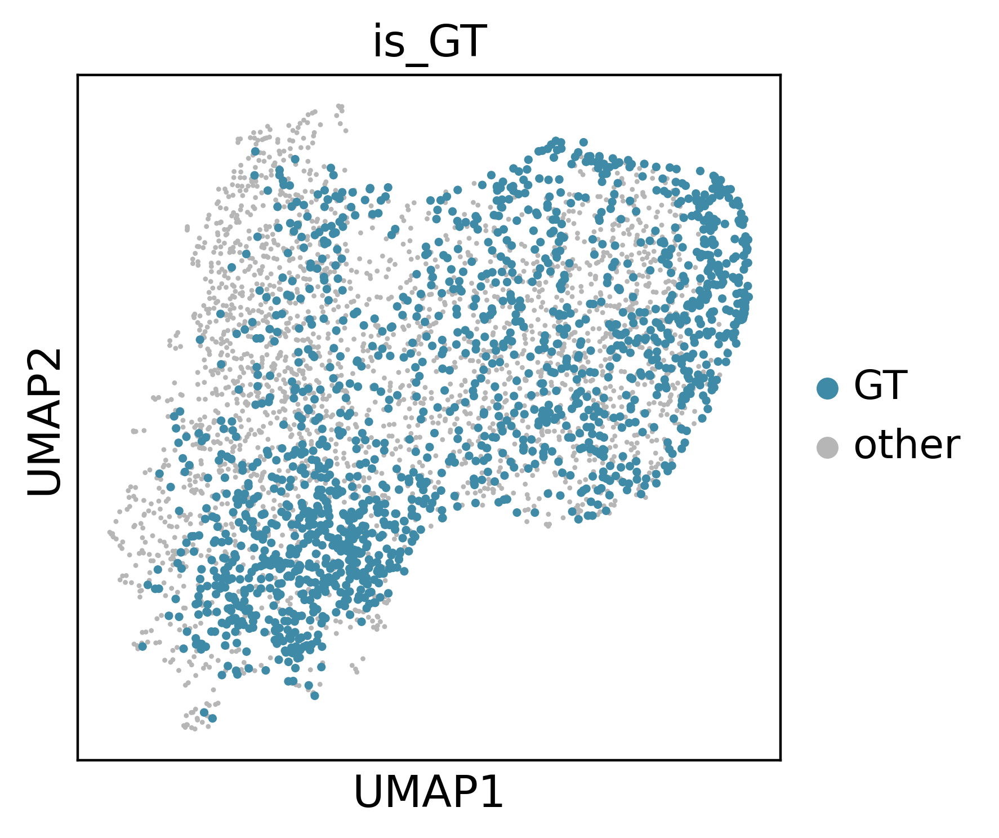

In [13]:
adata.obs["is_GT"] = adata.obs.apply(lambda x: "GT" if x["model"]=="GT" else "other", axis=1)

order = list(adata[adata.obs["model"]!="GT"].obs_names) + list(adata[adata.obs["model"]=="GT"].obs_names)
sizes = [30 if el=="GT" else 10 for el in adata[order].obs["model"]]
fig = sc.pl.umap(adata[order], color="is_GT", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_gt.png"))

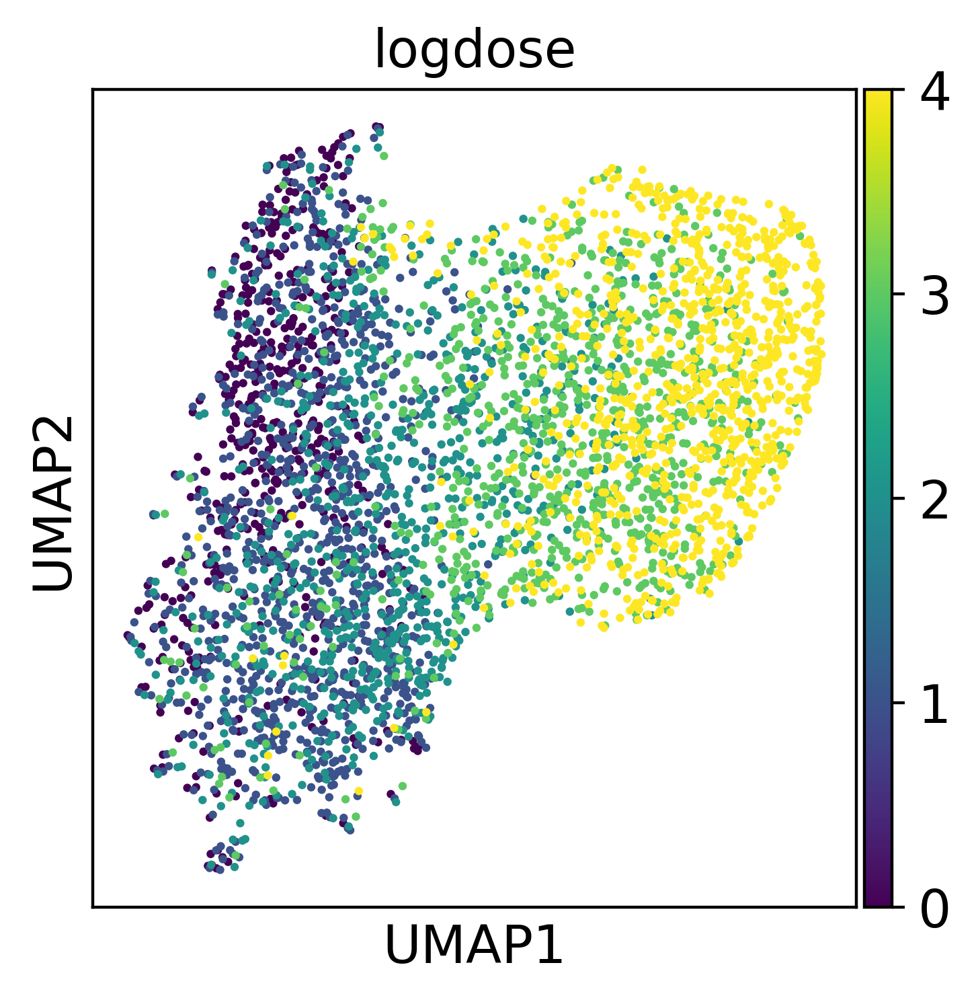

In [14]:
fig = sc.pl.umap(adata, color="logdose",size=20, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_logdose.png"))

In [15]:
adata = sc.read_h5ad(os.path.join(data_dir, "pseudodosages_dacinostat.h5ad"))
adata.obs["logdose"].value_counts()

logdose
1.000000    954
4.000000    935
3.000000    858
2.000000    820
0.000000    500
1.333333    500
1.666667    500
2.333333    500
2.666667    500
3.333333    500
3.666667    500
Name: count, dtype: int64

/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


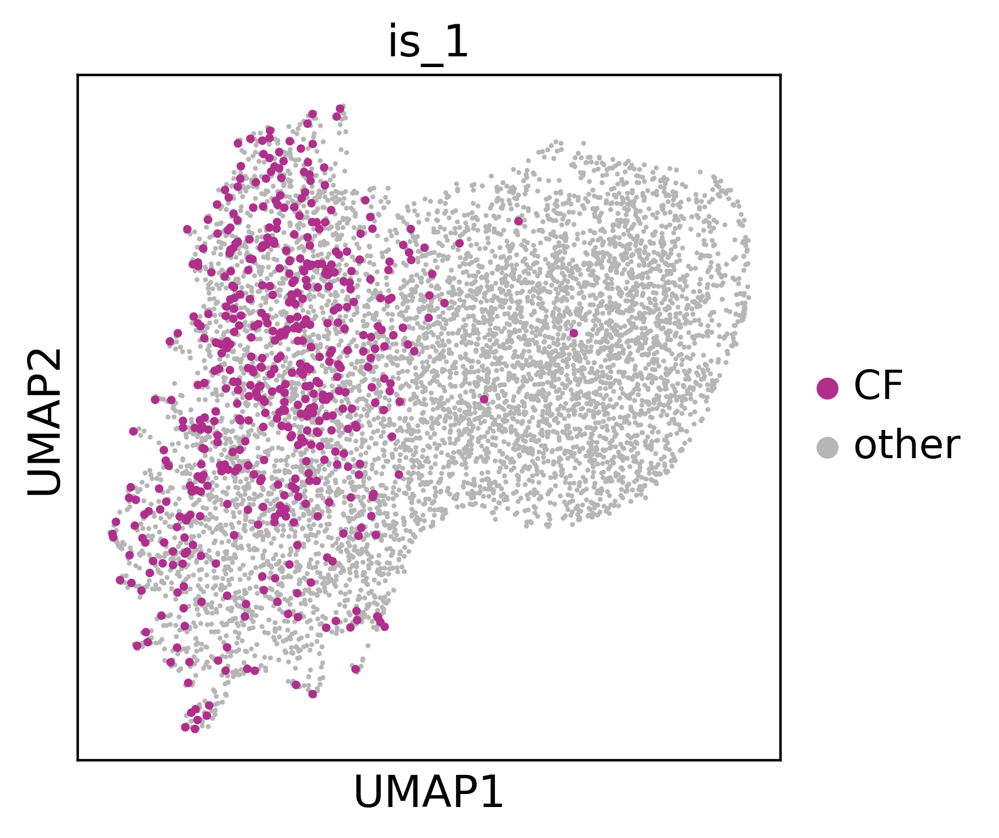

In [16]:
adata.obs["is_1"] = adata.obs.apply(lambda x: "CF" if ((x["dose"]==1.0) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_1"]!="CF"].obs_names) + list(adata[adata.obs["is_1"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_1"]]
fig = sc.pl.umap(adata[order], color="is_1", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_1.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


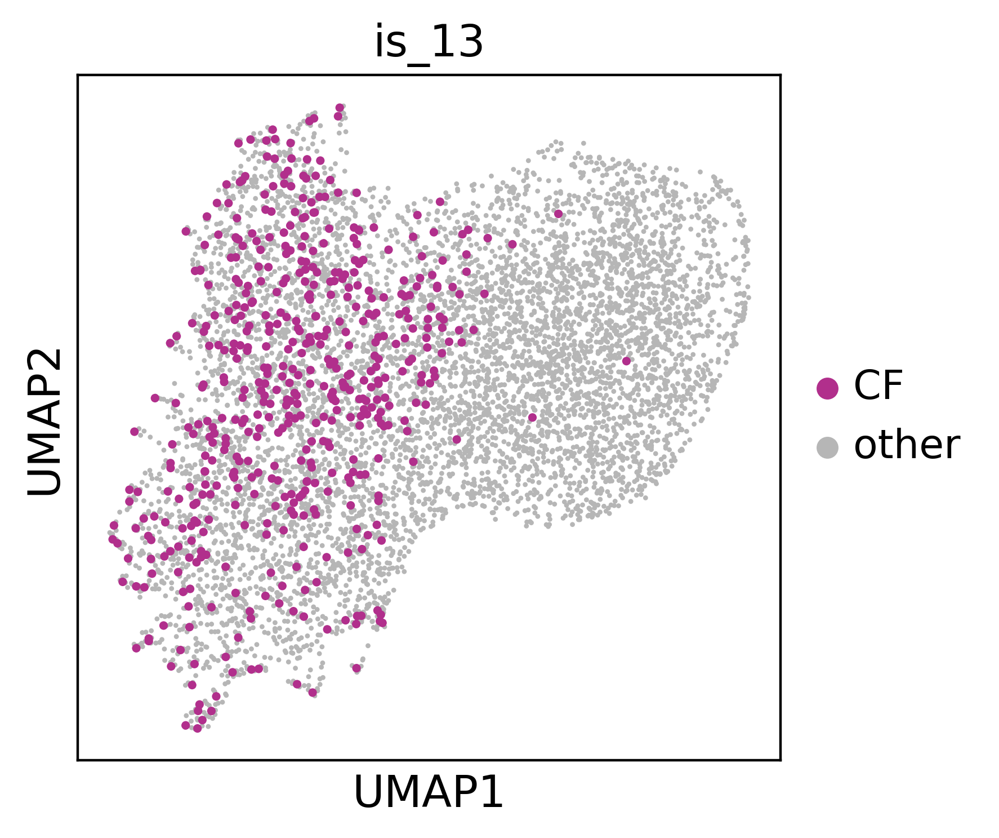

In [17]:
adata.obs["is_13"] = adata.obs.apply(lambda x: "CF" if ((1.3 < x["dose"]<1.4) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_13"]!="CF"].obs_names) + list(adata[adata.obs["is_13"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_13"]]
fig = sc.pl.umap(adata[order], color="is_13", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_13.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


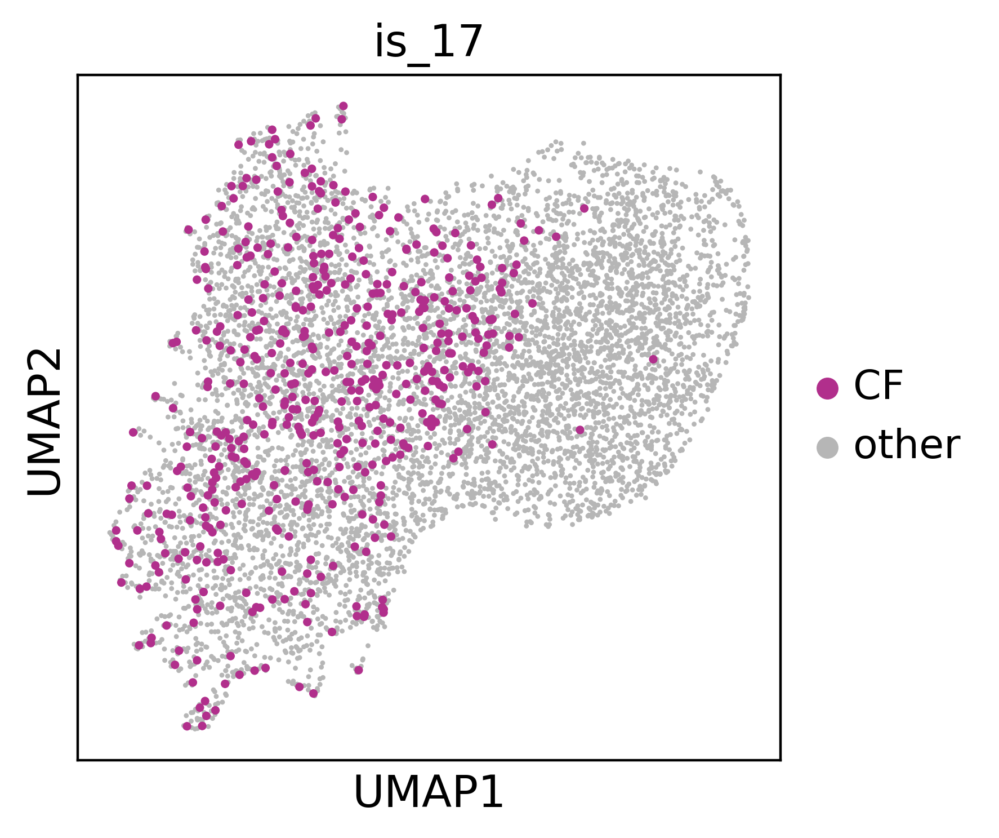

In [18]:
adata.obs["is_17"] = adata.obs.apply(lambda x: "CF" if ((1.6 < x["dose"]<1.7) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_17"]!="CF"].obs_names) + list(adata[adata.obs["is_17"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_17"]]
fig = sc.pl.umap(adata[order], color="is_17", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_17.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


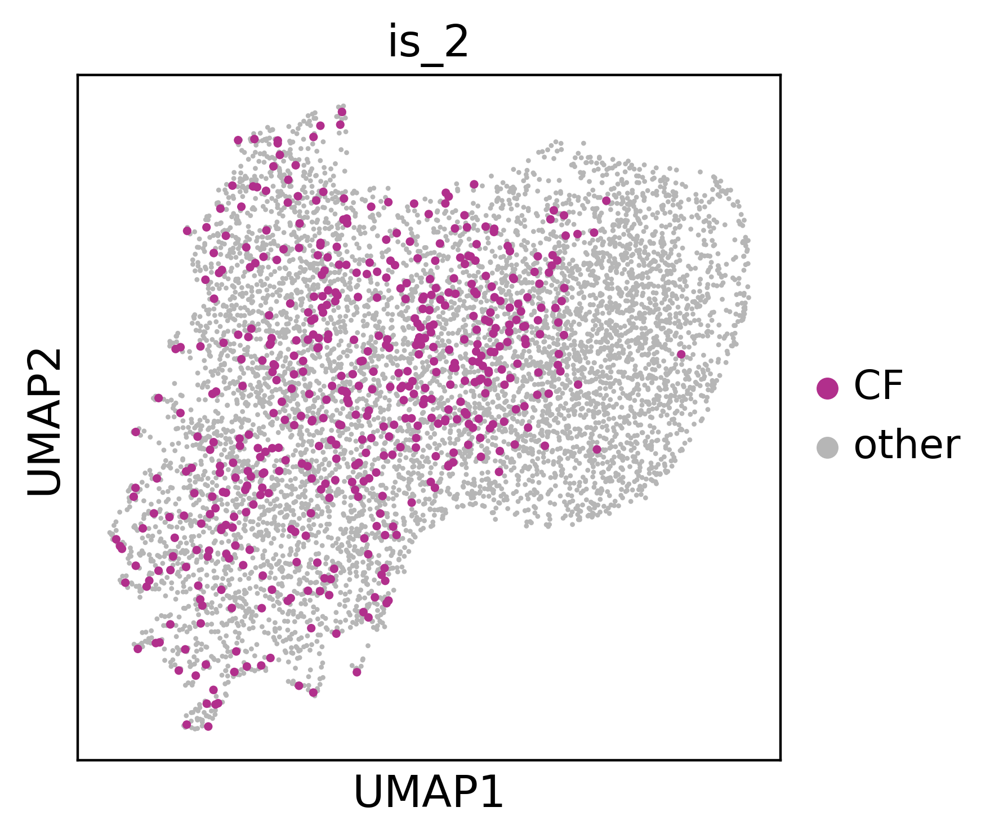

In [19]:
adata.obs["is_2"] = adata.obs.apply(lambda x: "CF" if ((1.9 < x["dose"]<2.1) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_2"]!="CF"].obs_names) + list(adata[adata.obs["is_2"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_2"]]
fig = sc.pl.umap(adata[order], color="is_2", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_2.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

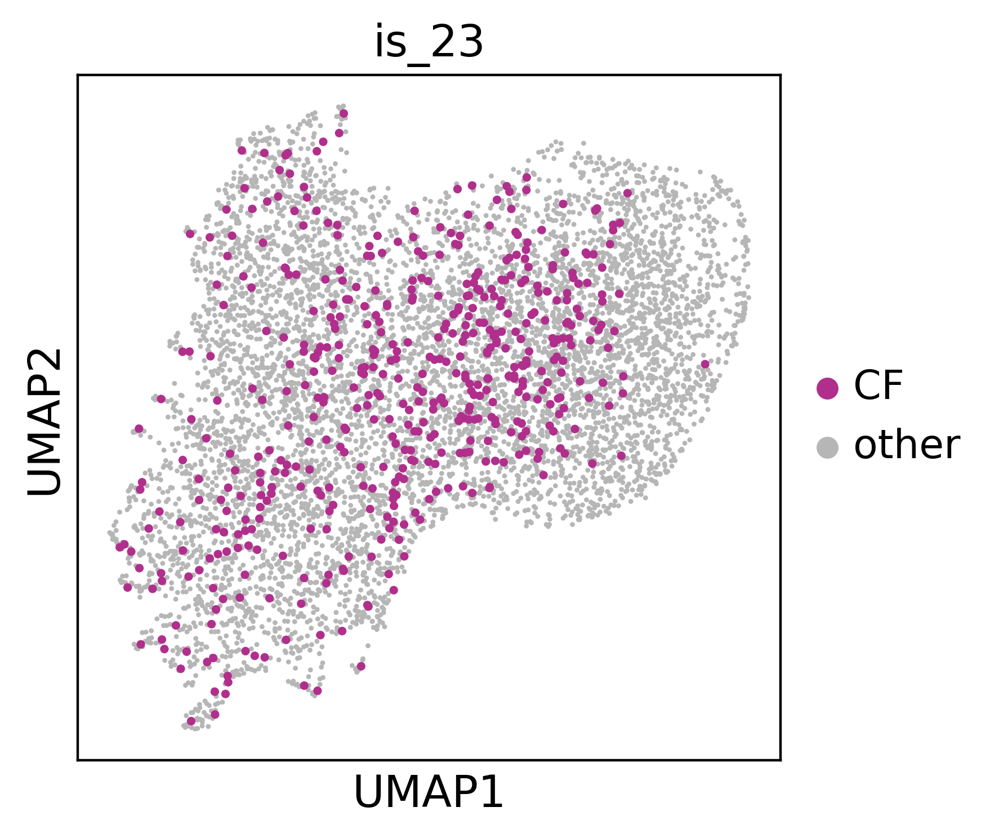

In [20]:
adata.obs["is_23"] = adata.obs.apply(lambda x: "CF" if ((2.3 < x["dose"]<2.4) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_23"]!="CF"].obs_names) + list(adata[adata.obs["is_23"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_23"]]
fig = sc.pl.umap(adata[order], color="is_23", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_23.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

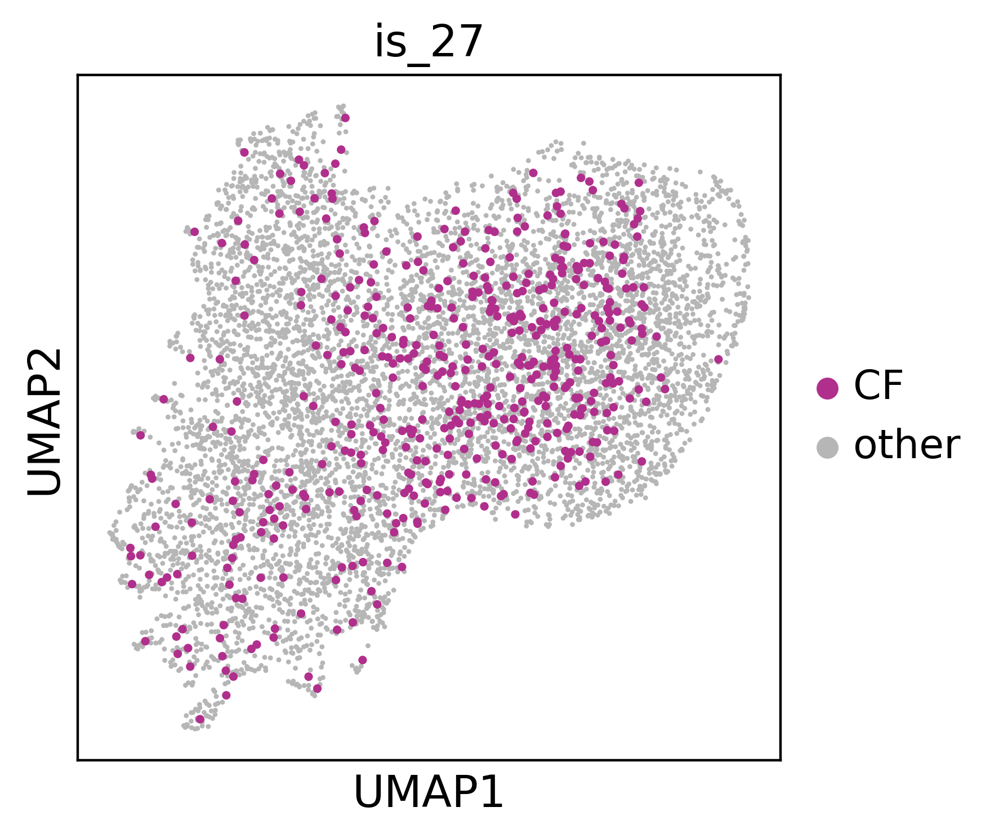

In [21]:
adata.obs["is_27"] = adata.obs.apply(lambda x: "CF" if ((2.6 < x["dose"]<2.7) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_27"]!="CF"].obs_names) + list(adata[adata.obs["is_27"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_27"]]
fig = sc.pl.umap(adata[order], color="is_27", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_27.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

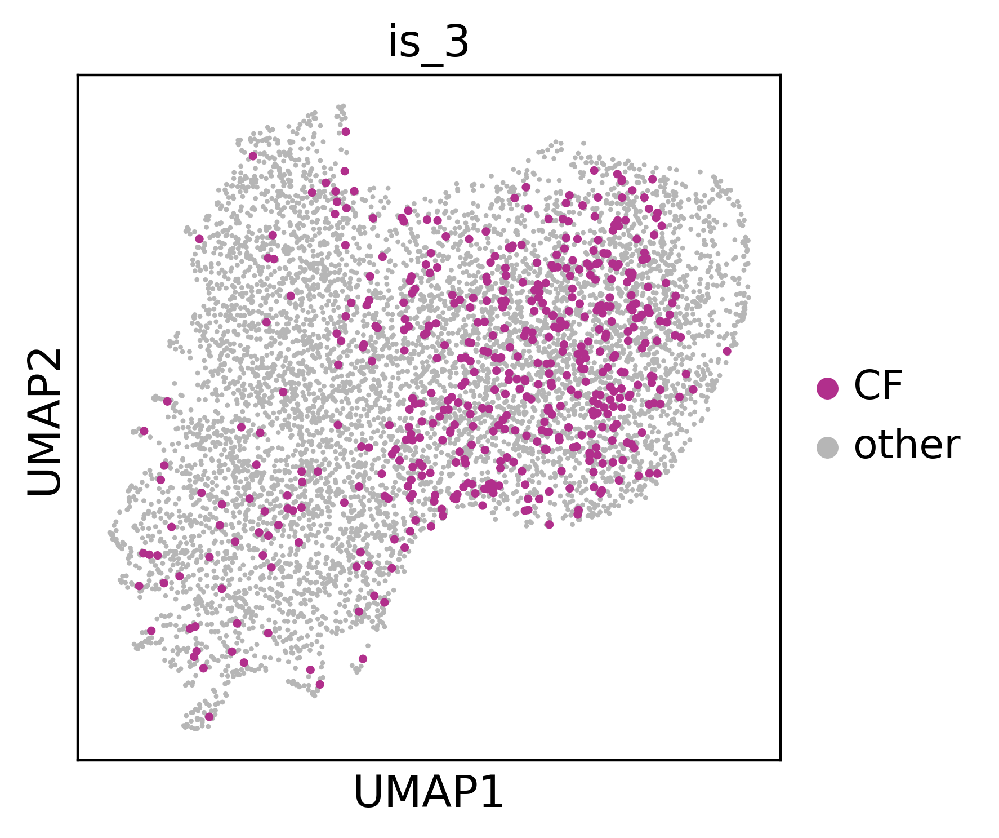

In [22]:
adata.obs["is_3"] = adata.obs.apply(lambda x: "CF" if ((2.9 < x["dose"]<3.1) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_3"]!="CF"].obs_names) + list(adata[adata.obs["is_3"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_3"]]
fig = sc.pl.umap(adata[order], color="is_3", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_3.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

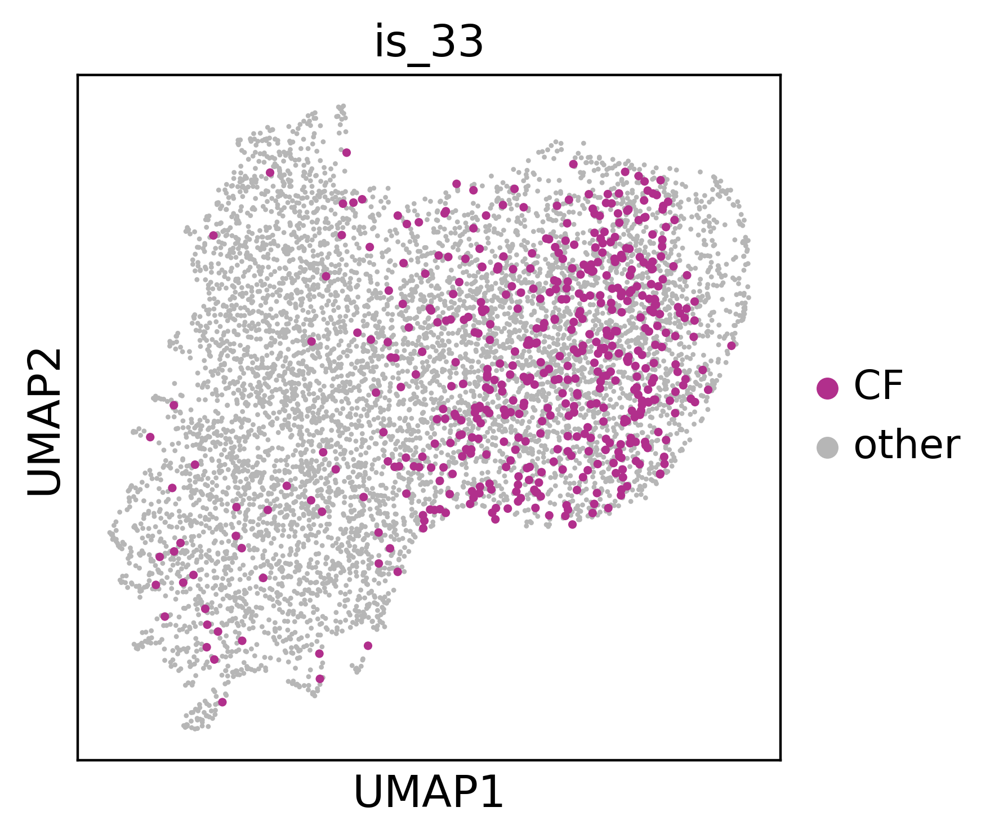

In [23]:
adata.obs["is_33"] = adata.obs.apply(lambda x: "CF" if ((3.2 < x["dose"]<3.4) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_33"]!="CF"].obs_names) + list(adata[adata.obs["is_33"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_33"]]
fig = sc.pl.umap(adata[order], color="is_33", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_33.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

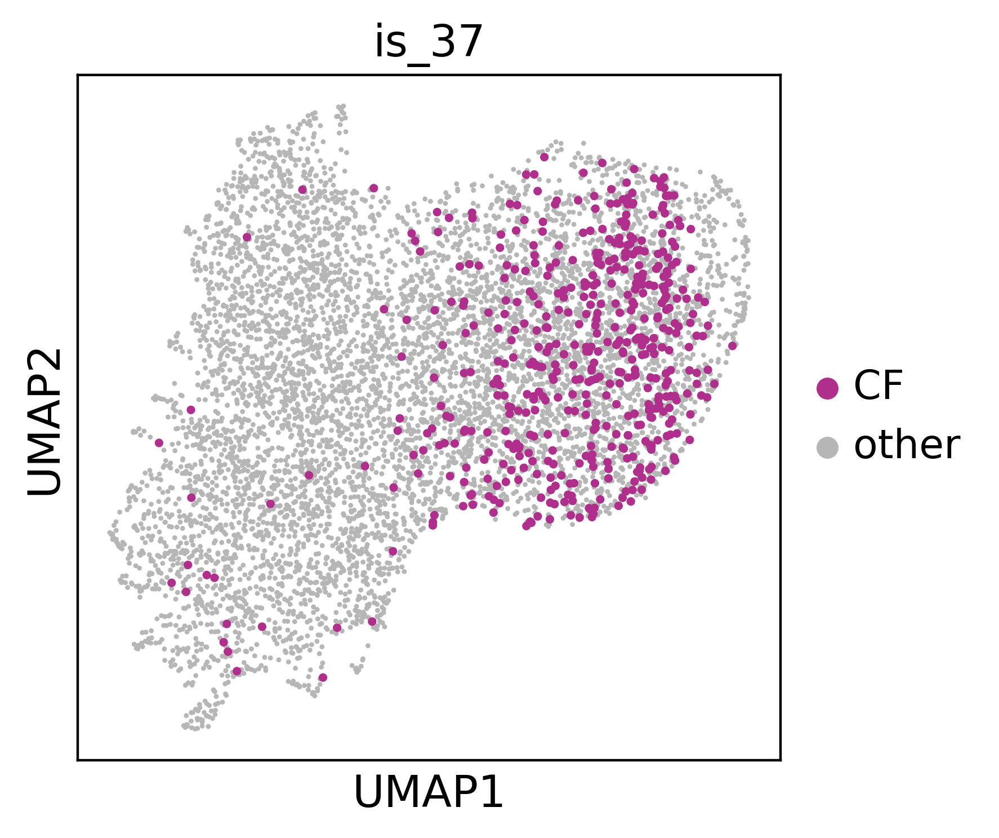

In [24]:
adata.obs["is_37"] = adata.obs.apply(lambda x: "CF" if ((3.6 < x["dose"]<3.7) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_37"]!="CF"].obs_names) + list(adata[adata.obs["is_37"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_37"]]
fig = sc.pl.umap(adata[order], color="is_37", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_37.png"))


/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/dominik.klein/mambaforge/envs/cfp/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModification

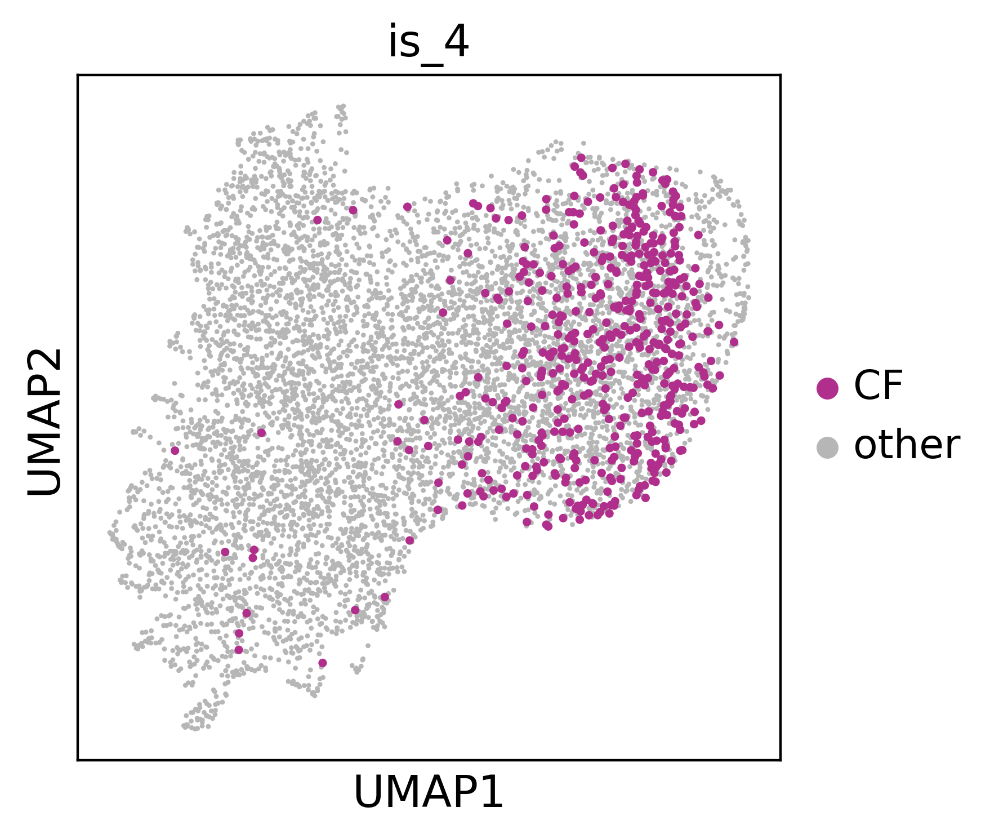

In [25]:
adata.obs["is_4"] = adata.obs.apply(lambda x: "CF" if ((3.9 < x["dose"]<4.1) and (x["mode"]=="pred")) else "other", axis=1)
order = list(adata[adata.obs["is_4"]!="CF"].obs_names) + list(adata[adata.obs["is_4"]=="CF"].obs_names)
sizes = [30 if el=="CF" else 10 for el in adata[order].obs["is_4"]]
fig = sc.pl.umap(adata[order], color="is_4", palette=color_dict, size=sizes, return_fig=True)
fig.savefig(os.path.join(out_dir, "umap_preds_dose_4.png"))
